In [1]:
%load_ext autoreload
%autoreload 2

# IMPORT

In [2]:
import numpy as np
import mne
import xarray as xr
import matplotlib.pyplot as plt
from scipy import signal
import ghibtools as gh
import pandas as pd
import seaborn as sns
import pingouin as pg
from params import *
from bibliotheque import *
from configuration import *
import physio
from compute_phase_freq import phase_freq_job, power_job, phase_freq_concat_job, erp_concat_job
from preproc import convert_vhdr_job, eeg_interp_artifact_job, preproc_job
from compute_cycle_signal import cycle_signal_job

/home/valentin.ghibaudo/.virtualenvs/py3.10_nodegpu/lib/python3.10/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.3, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


# GO

## Concat phase freq

In [32]:
chans = eeg_chans

exp = phase_freq_concat_job.get('Fz')['phase_freq_concat']

da = gh.init_da({'chan':chans, 'participant':exp['participant'].values, 
                 'session':exp['session'].values,'compress_cycle_mode':exp['compress_cycle_mode'].values, 
                 'freq':exp['freq'].values, 'phase':exp['phase'].values})
for chan in chans:
    da.loc[chan,:,:,:,:,:] = phase_freq_concat_job.get(chan)['phase_freq_concat'].values

da

<xarray.DataArray (chan: 32, participant: 30, session: 3,
                   compress_cycle_mode: 12, freq: 67, phase: 200)>
array([[[[[[-7.61322912e-01, -7.46708042e-01, -7.35558556e-01, ...,
            -7.72712886e-01, -7.72638559e-01, -7.61370669e-01],
           [-7.49516546e-01, -7.55614172e-01, -7.67835653e-01, ...,
            -7.41094267e-01, -7.53358117e-01, -7.41083438e-01],
           [-7.57803213e-01, -7.47492076e-01, -7.44192995e-01, ...,
            -7.41424175e-01, -7.48769977e-01, -7.53728529e-01],
           ...,
           [-8.34561755e-01, -8.13397584e-01, -8.13168648e-01, ...,
            -8.38685141e-01, -8.57110455e-01, -8.48924823e-01],
           [-7.99314699e-01, -8.13054900e-01, -8.01883698e-01, ...,
            -7.94639178e-01, -7.69664463e-01, -7.91461939e-01],
           [-7.80174924e-01, -7.87625581e-01, -7.92352063e-01, ...,
            -7.40639242e-01, -7.33003930e-01, -7.30699754e-01]],

          [[-5.91360788e-01, -5.92778949e-01, -5.90317356e-01, ...,
            -5.88408893e-01, -5.73185771e-01, -5.63135263e-01],
           [-5.73823791e-01, -5.90403869e-01, -5.80478082e-01, ...,
            -5.73896373e-01, -5.77228747e-01, -5.68979561e-01],
           [-5.86628281e-01, -5.93809775e-01, -6.07798066e-01, ...,
            -5.72676199e-01, -5.88398270e-01, -5.81060406e-01],
...
           [ 1.53107850e+00,  1.53736425e+00,  1.89673271e+00, ...,
             1.31763164e+00,  1.39468006e+00,  1.39914717e+00],
           [ 2.05087867e+00,  1.67135287e+00,  1.70639731e+00, ...,
             1.51401322e+00,  1.53121666e+00,  1.60939425e+00],
           [ 1.82705193e+00,  2.05695430e+00,  1.79118714e+00, ...,
             1.47615184e+00,  1.81124373e+00,  1.93465591e+00]],

          [[ 3.76245263e-02,  4.01294304e-02,  4.23185201e-02, ...,
             1.07515018e-01,  1.11086531e-01,  1.13569716e-01],
           [ 1.98613750e-02,  2.19086093e-02,  2.38719990e-02, ...,
             8.58728389e-02,  8.86922007e-02,  9.06192064e-02],
           [ 7.94540899e-03,  9.56721190e-03,  1.12999946e-02, ...,
             7.78033418e-02,  7.99349075e-02,  8.13378759e-02],
           ...,
           [ 3.74908085e-01,  3.68393885e-01,  3.54761015e-01, ...,
             3.36267282e-01,  3.41530780e-01,  3.43951874e-01],
           [ 4.20570785e-01,  4.11861033e-01,  3.96138479e-01, ...,
             3.35282627e-01,  3.42629212e-01,  3.48395253e-01],
           [ 4.41162031e-01,  4.32498298e-01,  4.13932559e-01, ...,
             3.46317898e-01,  3.55314223e-01,  3.64972630e-01]]]]]])
Coordinates:
  * chan                 (chan) <U4 'Fp1' 'Fz' 'F3' 'F7' ... 'F8' 'Fp2' 'Cz'
  * participant          (participant) object 'P01' 'P02' 'P03' ... 'P30' 'P31'
  * session              (session) object 'baseline' 'music' 'odor'
  * compress_cycle_mode  (compress_cycle_mode) float64 0.1 0.2 0.25 ... 0.9 10.0
  * freq                 (freq) float64 4.0 4.098 4.199 ... 18.97 19.44 19.92
  * phase                (phase) float64 0.0 0.005025 0.01005 ... 0.995 1.0

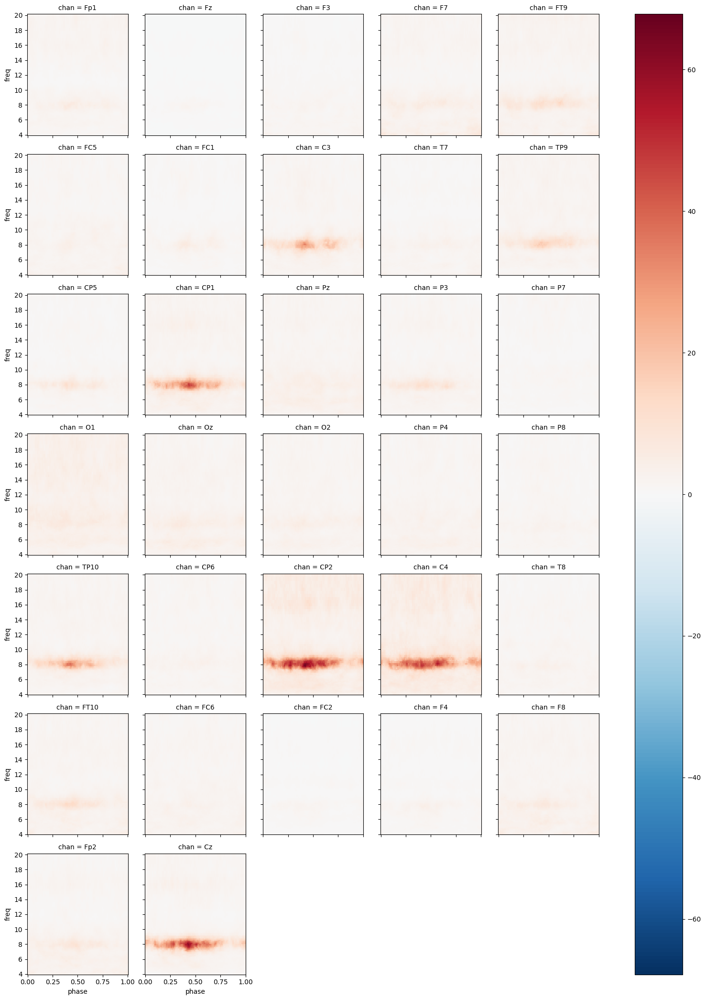

In [33]:
da.loc[:,'P09','odor',0.75,:,:].plot.pcolormesh(x = 'phase', y = 'freq', col = 'chan', col_wrap = 5)

In [35]:
da

<xarray.DataArray (chan: 32, participant: 30, session: 3,
                   compress_cycle_mode: 12, freq: 67, phase: 200)>
array([[[[[[-7.61322912e-01, -7.46708042e-01, -7.35558556e-01, ...,
            -7.72712886e-01, -7.72638559e-01, -7.61370669e-01],
           [-7.49516546e-01, -7.55614172e-01, -7.67835653e-01, ...,
            -7.41094267e-01, -7.53358117e-01, -7.41083438e-01],
           [-7.57803213e-01, -7.47492076e-01, -7.44192995e-01, ...,
            -7.41424175e-01, -7.48769977e-01, -7.53728529e-01],
           ...,
           [-8.34561755e-01, -8.13397584e-01, -8.13168648e-01, ...,
            -8.38685141e-01, -8.57110455e-01, -8.48924823e-01],
           [-7.99314699e-01, -8.13054900e-01, -8.01883698e-01, ...,
            -7.94639178e-01, -7.69664463e-01, -7.91461939e-01],
           [-7.80174924e-01, -7.87625581e-01, -7.92352063e-01, ...,
            -7.40639242e-01, -7.33003930e-01, -7.30699754e-01]],

          [[-5.91360788e-01, -5.92778949e-01, -5.90317356e-01, ...,
            -5.88408893e-01, -5.73185771e-01, -5.63135263e-01],
           [-5.73823791e-01, -5.90403869e-01, -5.80478082e-01, ...,
            -5.73896373e-01, -5.77228747e-01, -5.68979561e-01],
           [-5.86628281e-01, -5.93809775e-01, -6.07798066e-01, ...,
            -5.72676199e-01, -5.88398270e-01, -5.81060406e-01],
...
           [ 1.53107850e+00,  1.53736425e+00,  1.89673271e+00, ...,
             1.31763164e+00,  1.39468006e+00,  1.39914717e+00],
           [ 2.05087867e+00,  1.67135287e+00,  1.70639731e+00, ...,
             1.51401322e+00,  1.53121666e+00,  1.60939425e+00],
           [ 1.82705193e+00,  2.05695430e+00,  1.79118714e+00, ...,
             1.47615184e+00,  1.81124373e+00,  1.93465591e+00]],

          [[ 3.76245263e-02,  4.01294304e-02,  4.23185201e-02, ...,
             1.07515018e-01,  1.11086531e-01,  1.13569716e-01],
           [ 1.98613750e-02,  2.19086093e-02,  2.38719990e-02, ...,
             8.58728389e-02,  8.86922007e-02,  9.06192064e-02],
           [ 7.94540899e-03,  9.56721190e-03,  1.12999946e-02, ...,
             7.78033418e-02,  7.99349075e-02,  8.13378759e-02],
           ...,
           [ 3.74908085e-01,  3.68393885e-01,  3.54761015e-01, ...,
             3.36267282e-01,  3.41530780e-01,  3.43951874e-01],
           [ 4.20570785e-01,  4.11861033e-01,  3.96138479e-01, ...,
             3.35282627e-01,  3.42629212e-01,  3.48395253e-01],
           [ 4.41162031e-01,  4.32498298e-01,  4.13932559e-01, ...,
             3.46317898e-01,  3.55314223e-01,  3.64972630e-01]]]]]])
Coordinates:
  * chan                 (chan) <U4 'Fp1' 'Fz' 'F3' 'F7' ... 'F8' 'Fp2' 'Cz'
  * participant          (participant) object 'P01' 'P02' 'P03' ... 'P30' 'P31'
  * session              (session) object 'baseline' 'music' 'odor'
  * compress_cycle_mode  (compress_cycle_mode) float64 0.1 0.2 0.25 ... 0.9 10.0
  * freq                 (freq) float64 4.0 4.098 4.199 ... 18.97 19.44 19.92
  * phase                (phase) float64 0.0 0.005025 0.01005 ... 0.995 1.0

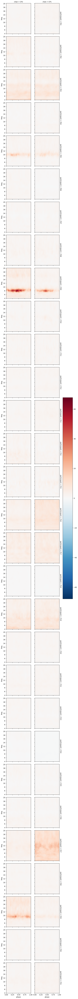

In [57]:
da.loc[['CP2','CP1'], :, 'odor', 0.75, :,:].plot.pcolormesh(x = 'phase', y = 'freq', row = 'participant', col = 'chan')

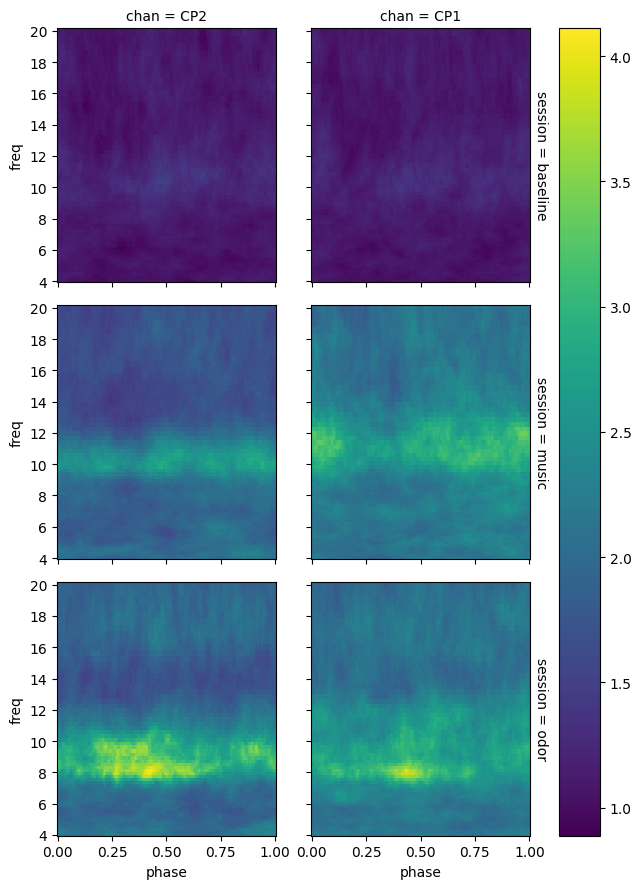

In [59]:
da.loc[['CP2','CP1'], :, :, 0.75, :,:].mean('participant').plot.pcolormesh(x = 'phase', y = 'freq', col = 'chan', row = 'session')

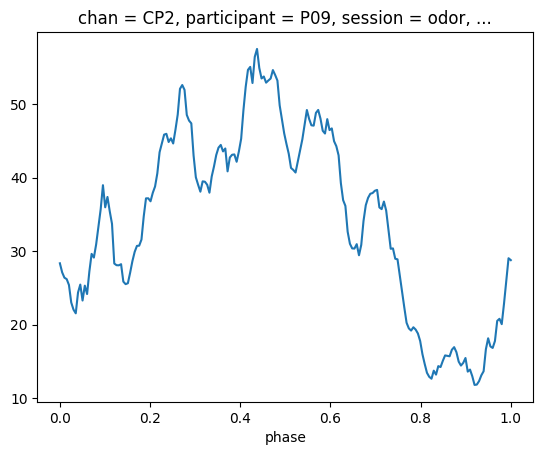

In [38]:
da.loc['CP2','P09','odor',0.75,:,:][30].plot.line()

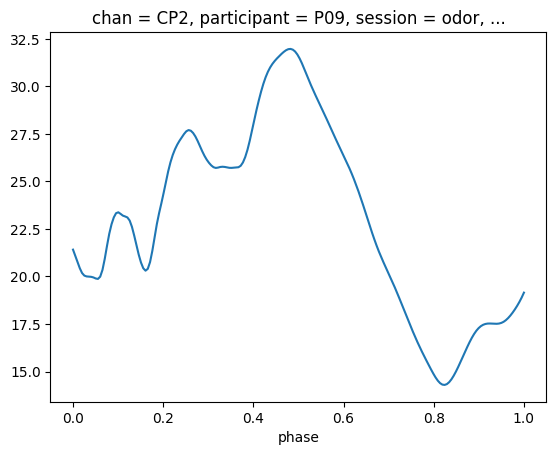

In [40]:
da.loc['CP2','P09','odor',10,:,:][30].plot.line()

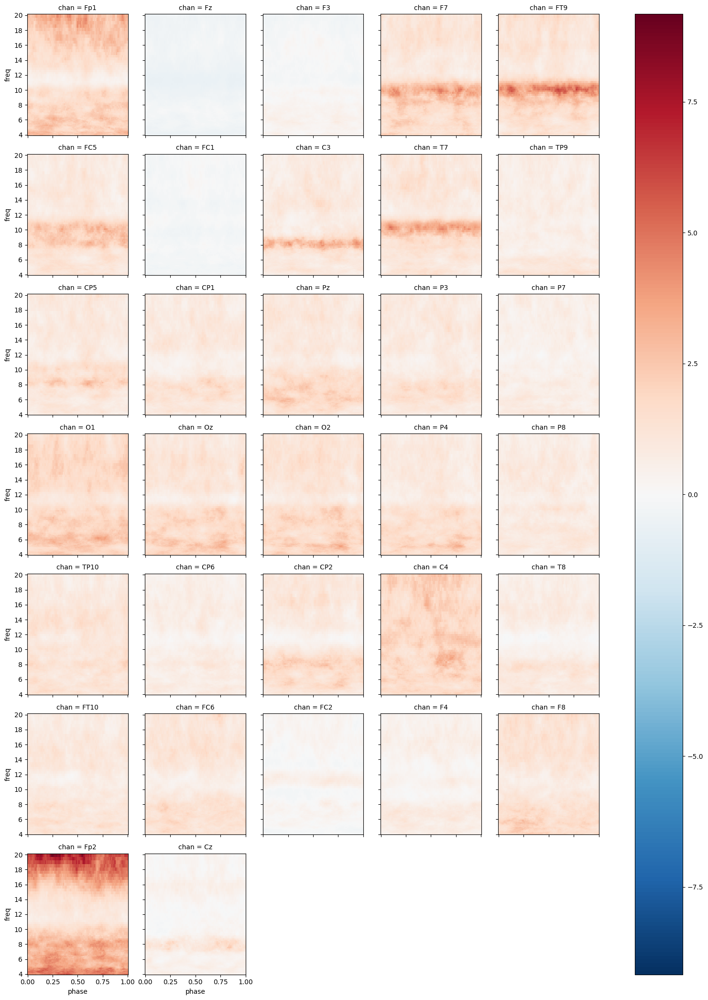

In [34]:
da.loc[:,'P09','music',0.75,:,:].plot.pcolormesh(x = 'phase', y = 'freq', col = 'chan', col_wrap = 5)

## Test peak to peak 4 to 20 Hz on the phase axis in one participant / session

/tmp/ipykernel_8267/3411486029.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


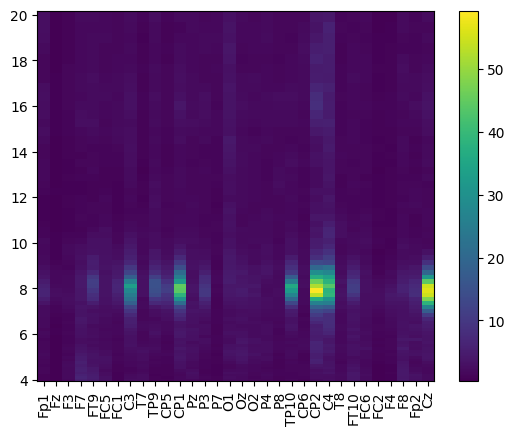

In [5]:
sub = 'P09'
ses = 'odor'
fig, ax = plt.subplots()
ptp = np.ptp(da.loc[:,sub,ses,0.75,:,:].values, axis = -1)
im = ax.pcolormesh(da['chan'], da['freq'],  ptp.T)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
fig.colorbar(im, ax=ax)
plt.show()

## Average ptp phase axis over space

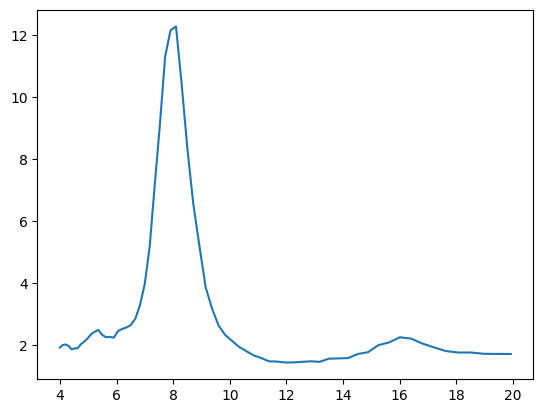

In [6]:
fig, ax = plt.subplots()
ax.plot(da['freq'],  ptp.mean(axis = 0))
# ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
plt.show()

## Test ptp on all channels / participants

In [7]:
da_ptp = gh.init_da({'chan':chans, 'participant':exp['participant'].values, 
                 'session':exp['session'].values,'compress_cycle_mode':exp['compress_cycle_mode'].values, 
                 'freq':exp['freq'].values})
da_ptp[:] = np.ptp(da.values, axis = -1)

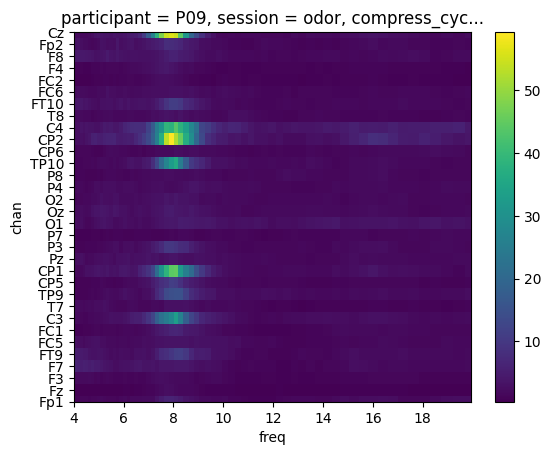

In [8]:
da_ptp.loc[:,'P09','odor',0.75,:].plot.pcolormesh()

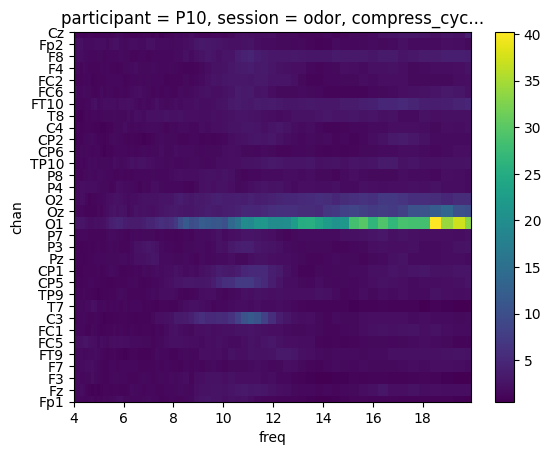

In [41]:
da_ptp.loc[:,'P10','odor',0.75,:].plot.pcolormesh()

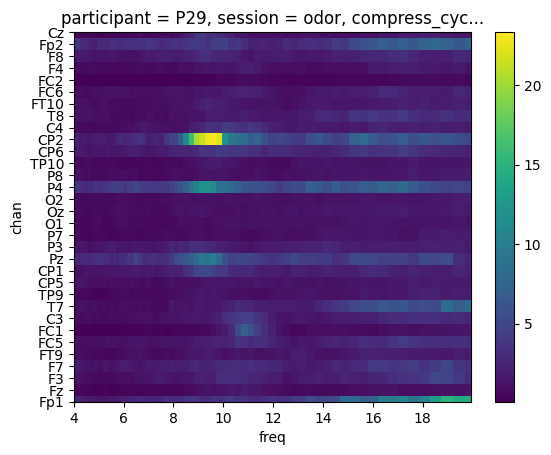

In [48]:
da_ptp.loc[:,'P29','odor',0.75,:].plot.pcolormesh()

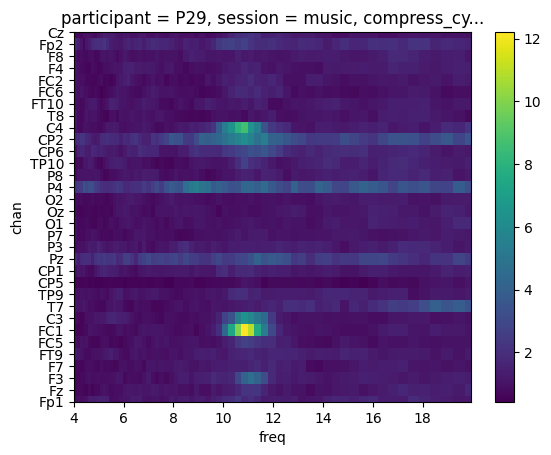

In [50]:
da_ptp.loc[:,'P29','music',0.75,:].plot.pcolormesh()

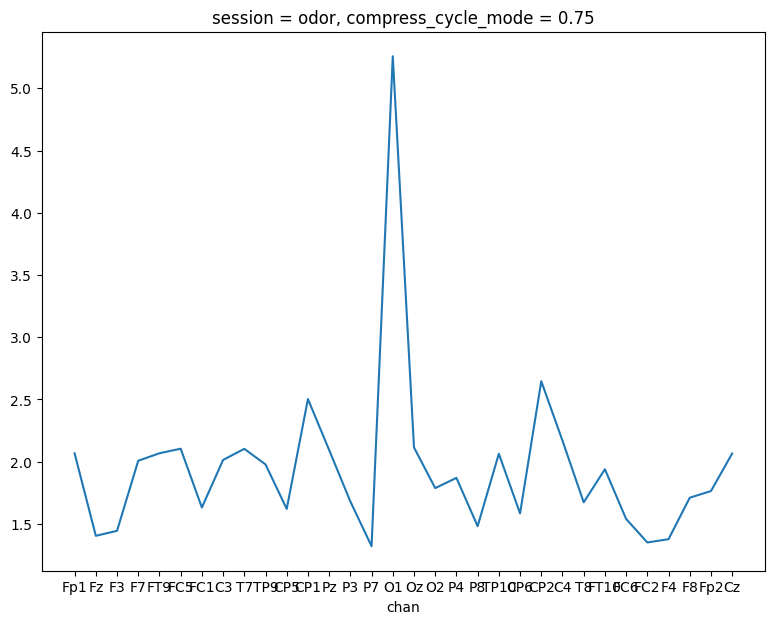

In [51]:
da_ptp.loc[:,:,:,0.75,6:14].mean('freq').mean('participant').loc[:,'odor'].plot(size = 7)

## Datarray ptp to dataframe ptp alpha (6 to 14 Hz)

In [52]:
da_ptp_mean_freq = da_ptp.sel(freq = slice(6,14), compress_cycle_mode = 0.75).mean('freq')

rows = []

for sub in da_ptp['participant'].values:
    for ses in da_ptp['session'].values:
        for chan in da_ptp['chan'].values:
            rows.append([sub, ses, chan, da_ptp_mean_freq.loc[chan, sub, ses].values])
df_ptp = pd.DataFrame(rows, columns = ['sub','ses','chan','ptp'])

## Datarray ptp to dataframe ptp alpha (15 to 35 Hz)

In [52]:
da_ptp_mean_freq = da_ptp.sel(freq = slice(15,35), compress_cycle_mode = 0.75).mean('freq')

rows = []

for sub in da_ptp['participant'].values:
    for ses in da_ptp['session'].values:
        for chan in da_ptp['chan'].values:
            rows.append([sub, ses, chan, da_ptp_mean_freq.loc[chan, sub, ses].values])
df_ptp = pd.DataFrame(rows, columns = ['sub','ses','chan','ptp'])

## Topoplots ptp alpha : one figure by participant with to subplots (msuci / odor)

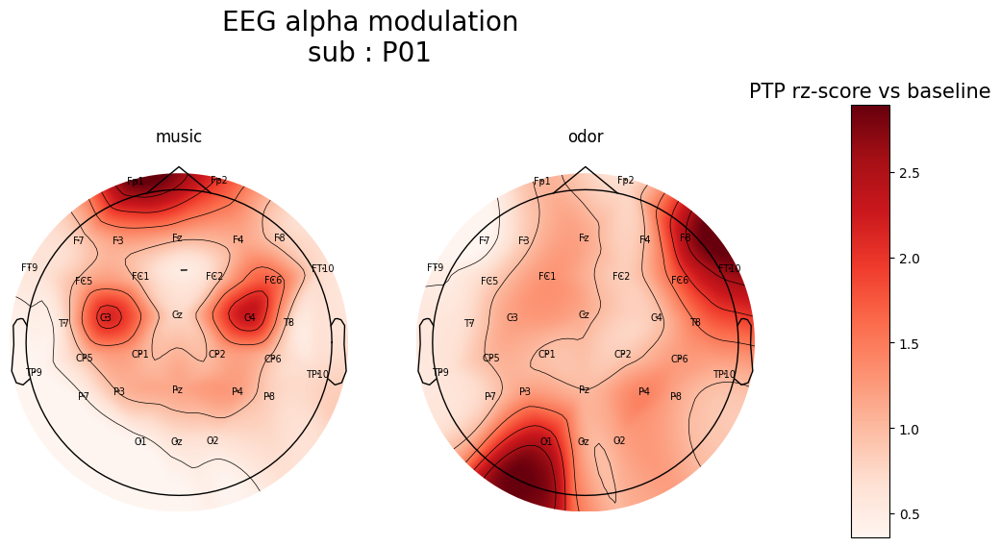

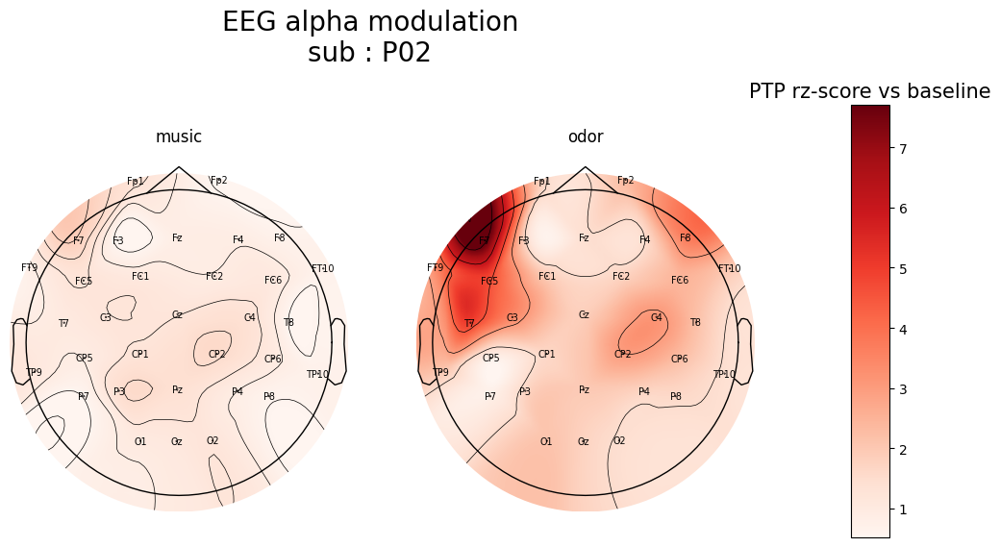

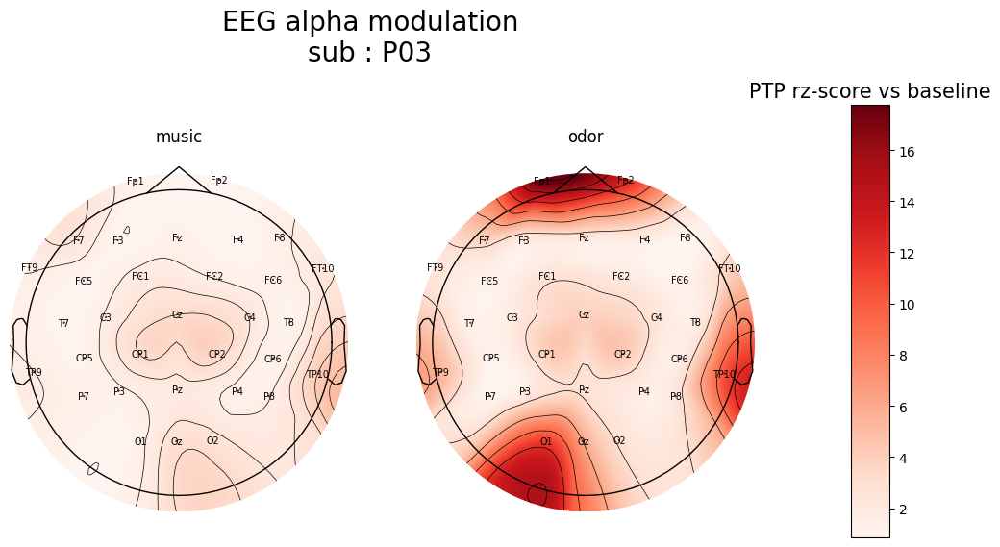

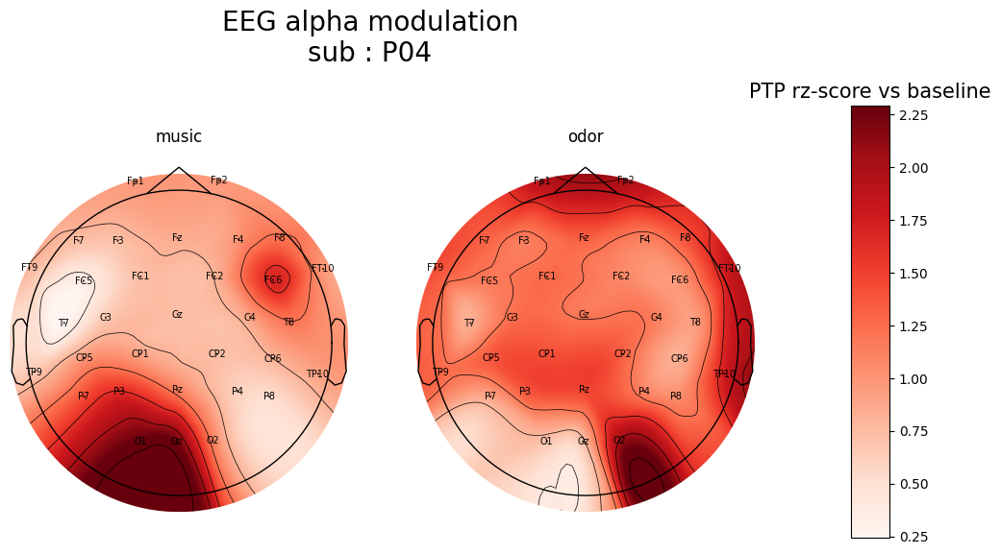

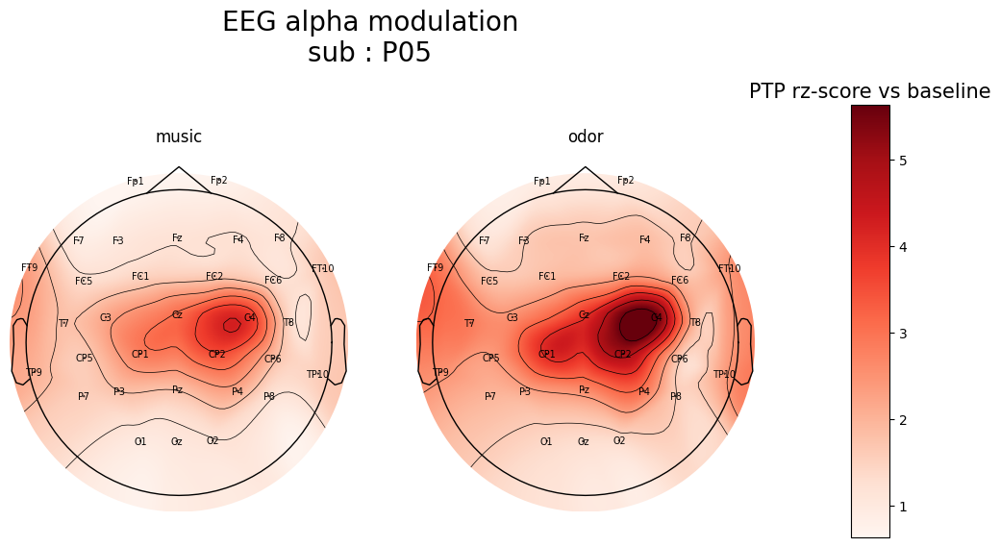

...

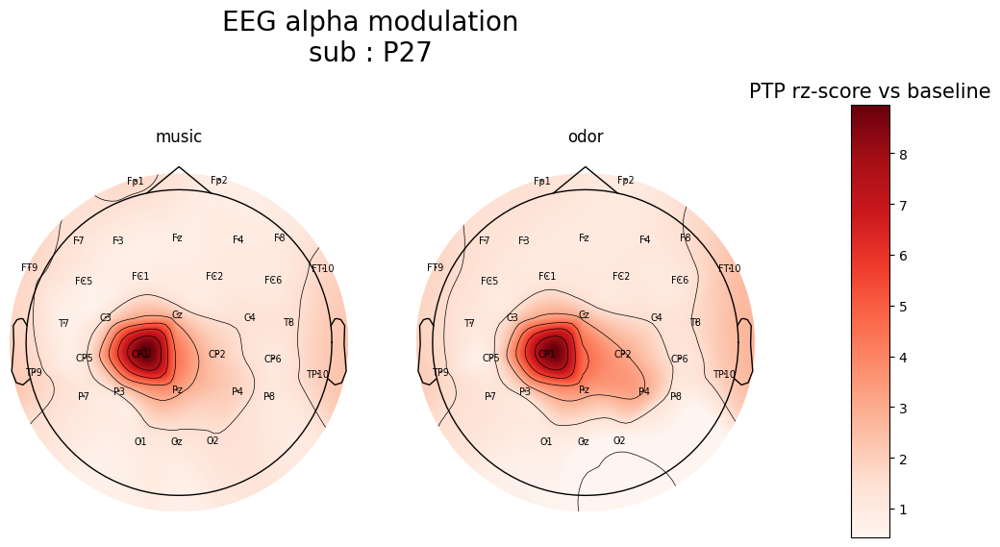

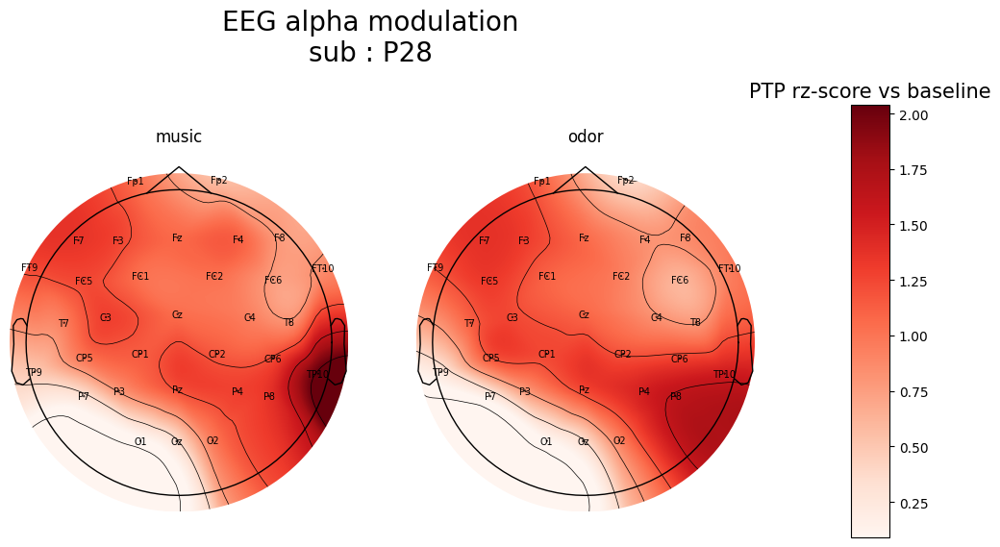

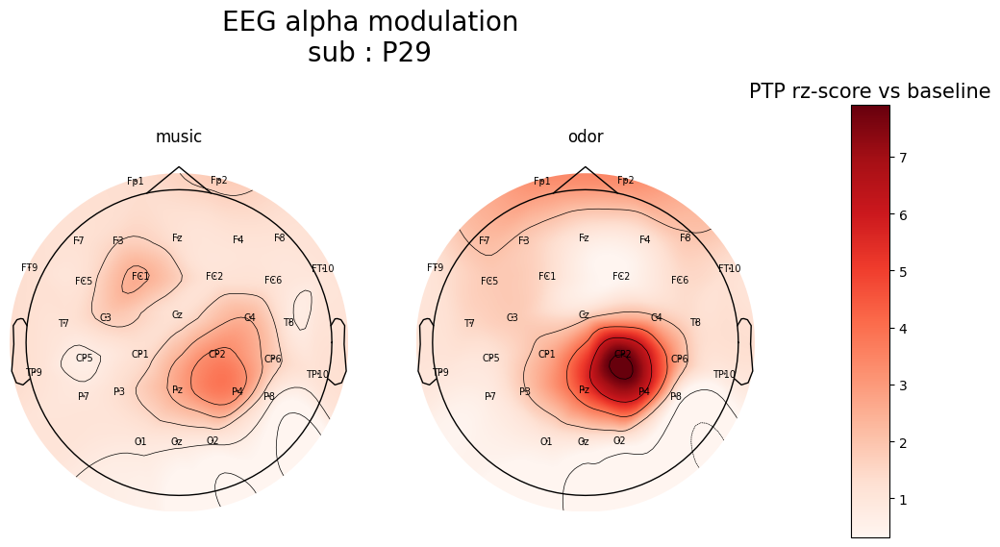

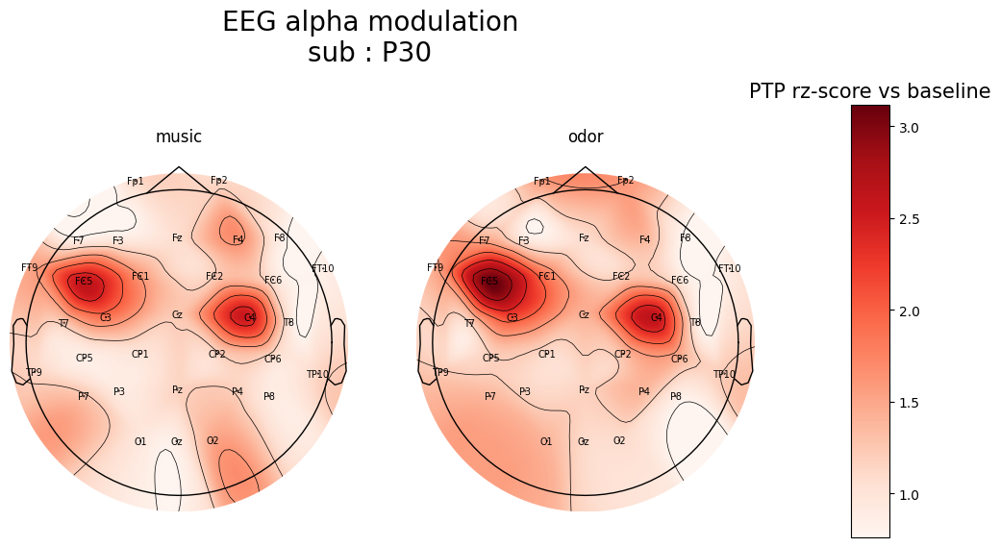

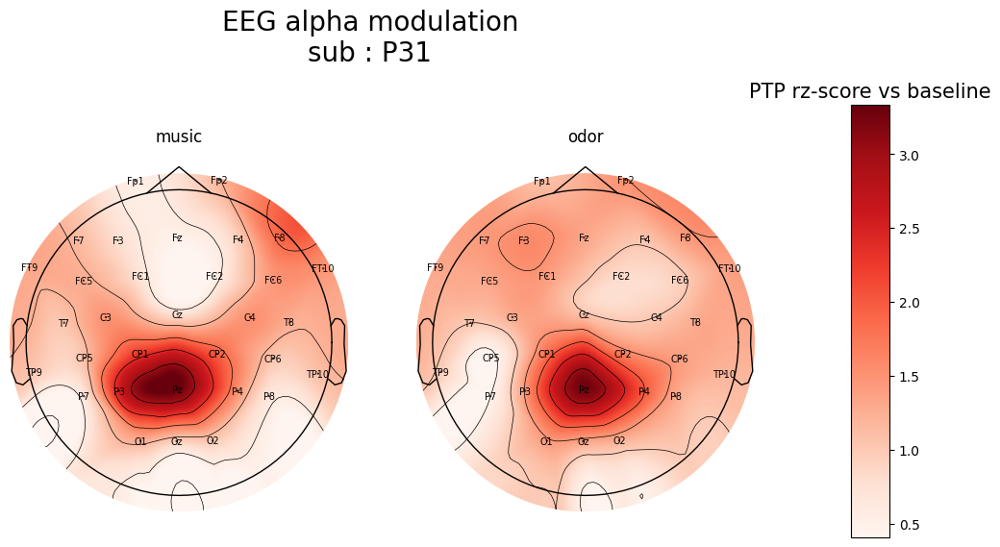

In [53]:
delta_quantile = 0.
sess = ['music','odor']
pos = get_pos()

for sub in da_ptp_mean_freq['participant'].values:
    
    fig, axs = plt.subplots(ncols = len(sess), figsize = (10,5))
    fig.suptitle(f'EEG alpha modulation\nsub : {sub}', fontsize = 20, y = 1.2)

    da_sub = da_ptp_mean_freq.sel(participant = sub, session = ['music','odor'])
    
    vmin = da_sub.quantile(delta_quantile)
    vmax = da_sub.quantile(1  - delta_quantile)

    for c, ses in enumerate(sess):
        ax = axs[c]
        data = da_sub.sel(session = ses).values
        im, cn = mne.viz.plot_topomap(data = data , pos = pos, names = chans, axes = ax, show = False, vlim = (vmin,vmax))
        ax.set_title(f'{ses}')

    ax_x_start = 1
    ax_x_width = 0.04
    ax_y_start = 0.1
    ax_y_height = 0.9
    cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
    clb = fig.colorbar(im, cax=cbar_ax)
    clb.ax.set_title('PTP rz-score vs baseline',fontsize=15)
    
    plt.show()

# file = base_folder / 'Figures' / 'Cycle_Signal' / 'amplitude_modulation' / 'cycle_signal_all.png'

# fig.savefig(file, bbox_inches = 'tight')

In [12]:
df_ptp['ptp'] = df_ptp['ptp'].astype(float)
df_ptp.dtypes

sub      object
ses      object
chan     object
ptp     float64
dtype: object

In [13]:
df_ptp.groupby(['ses','chan']).mean(numeric_only = True)

ptp
ses      chan          
baseline C3    1.458506
         C4    1.374783
         CP1   1.308926
         CP2   1.332539
         CP5   1.318470
...                 ...
odor     Pz    2.093770
         T7    2.103313
         T8    1.673641
         TP10  2.063623
         TP9   1.978268

[96 rows x 1 columns]

In [14]:
df_ptp.groupby(['ses','chan']).mean(numeric_only = True).loc[('odor'),:]

,ptp
chan,
C3,2.014104
C4,2.169213
CP1,2.503610
CP2,2.646649
CP5,1.620671
CP6,1.584449
Cz,2.065920
F3,1.444716
F4,1.377401


## Topoplots ptp alpha : average over participants

Text(0.5, 1.0, 'Amplitude Modulation\nRatio to baseline')

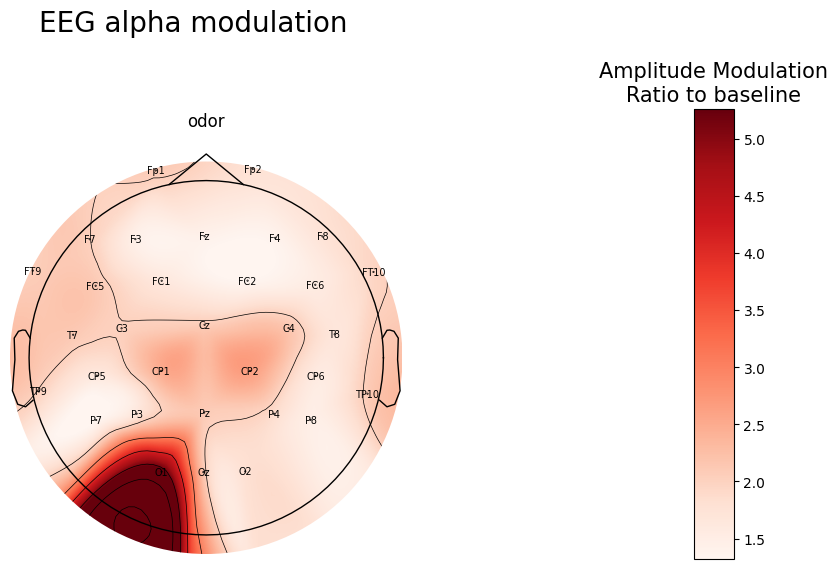

In [15]:
ses = 'odor'
data = df_ptp.groupby(['ses','chan']).mean(numeric_only = True).loc[(ses),:].reindex(chans)['ptp'].values

delta_quantile = 0.

vmin = np.quantile(data, delta_quantile)
vmax = np.quantile(data, 1 - delta_quantile)
    
pos = get_pos()

fig, ax = plt.subplots(figsize = (10,5))
fig.suptitle(f'EEG alpha modulation', fontsize = 20, y = 1.2)

im, cn = mne.viz.plot_topomap(data = data , pos = pos, names = chans, axes = ax, show = False, vlim = (vmin,vmax))
ax.set_title(f'{ses}')

ax_x_start = 1
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('Amplitude Modulation\nRatio to baseline',fontsize=15)

# file = base_folder / 'Figures' / 'Cycle_Signal' / 'amplitude_modulation' / 'cycle_signal_all.png'

# fig.savefig(file, bbox_inches = 'tight')

In [54]:
ses = 'music'
data = df_ptp.groupby(['ses','chan']).mean(numeric_only = True).loc[(ses),:].reindex(chans)['ptp'].values

delta_quantile = 0.

vmin = np.quantile(data, delta_quantile)
vmax = np.quantile(data, 1 - delta_quantile)
    
pos = get_pos()

fig, ax = plt.subplots(figsize = (10,5))
fig.suptitle(f'EEG alpha modulation', fontsize = 20, y = 1.2)

im, cn = mne.viz.plot_topomap(data = data , pos = pos, names = chans, axes = ax, show = False, vlim = (vmin,vmax))
ax.set_title(f'{ses}')

ax_x_start = 1
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('Amplitude Modulation\nRatio to baseline',fontsize=15)

# file = base_folder / 'Figures' / 'Cycle_Signal' / 'amplitude_modulation' / 'cycle_signal_all.png'

# fig.savefig(file, bbox_inches = 'tight')

KeyError: 'ptp'

## Test circular stats with alpha modulation for all freq bins and chans in one participant / session

In [60]:
from circular_stats import HR2T

In [61]:
sub , ses = 'P09', 'odor'

angles = da['phase'].values * 2 * np.pi

rows = []
for chan in chans:
    for i, f in enumerate(da['freq'].values):
        distrib = da.loc[chan,sub,ses,0.75, f,:].values
        if sum(distrib < 0) >= 0:
            distrib = distrib + np.abs(np.min(distrib))
        distrib = distrib / np.mean(distrib)
        r = pg.circ_r(angles, w = distrib)
        ptp = np.ptp(distrib)
        mi = gh.Modulation_Index(distrib / sum(distrib))
        rows.append([chan,i, f,r,ptp, mi])
modulation = pd.DataFrame(rows, columns = ['chan','ind_f','f','r','ptp','mi'])

/mnt/autofs/cmo/users/ValentinGhibaudo/ghibtools/ghibtools/pac.py:12: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.where(a != 0, a * np.log(a / b), 0))
/mnt/autofs/cmo/users/ValentinGhibaudo/ghibtools/ghibtools/pac.py:12: RuntimeWarning: invalid value encountered in multiply
  return np.sum(np.where(a != 0, a * np.log(a / b), 0))


In [62]:
modulation

,chan,ind_f,f,r,ptp,mi
0,Fp1,0,4.000000,0.009689,0.580003,0.001355
1,Fp1,1,4.098491,0.013596,0.616704,0.001825
2,Fp1,2,4.199407,0.046449,0.673744,0.002002
3,Fp1,3,4.302807,0.079125,0.842412,0.002916
4,Fp1,4,4.408754,0.078314,0.772579,0.002364
...,...,...,...,...,...,...
2139,Cz,62,18.072824,0.084125,0.869174,0.003180
2140,Cz,63,18.517826,0.075084,0.645769,0.001971
2141,Cz,64,18.973784,0.060884,0.822739,0.001657
2142,Cz,65,19.440970,0.055269,0.654485,0.001852


## Correlation between circular stats metrics

<Axes: >

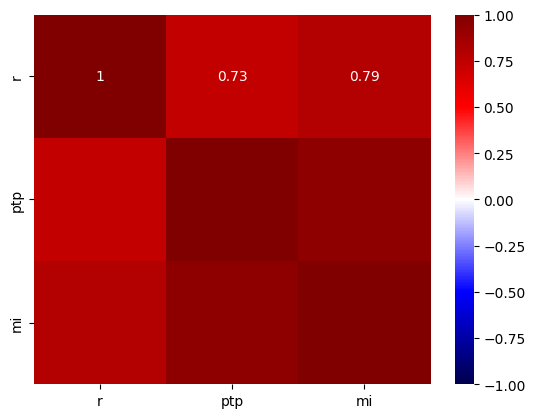

In [19]:
sns.heatmap(modulation[['r','ptp','mi']].corr(method = 'pearson'), cmap = 'seismic', vmin = -1,vmax = 1, annot = True)

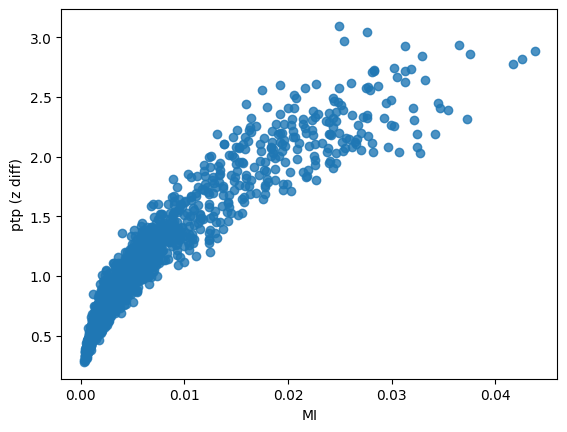

In [20]:
fig , ax = plt.subplots()
ax.scatter(modulation['mi'], modulation['ptp'], alpha = 0.8)
ax.set_ylabel('ptp (z diff)')
ax.set_xlabel('MI')
plt.show()

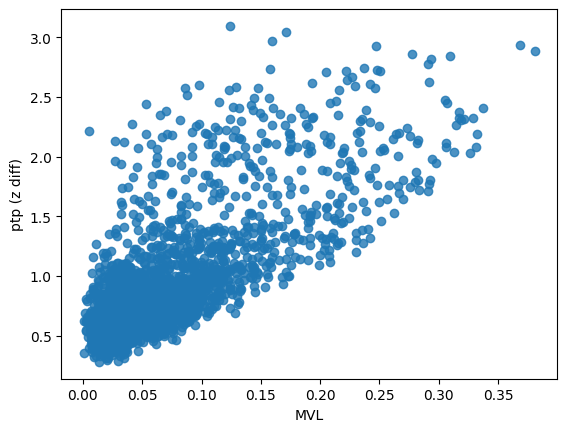

In [21]:
fig , ax = plt.subplots()
ax.scatter(modulation['r'], modulation['ptp'], alpha = 0.8)
ax.set_ylabel('ptp (z diff)')
ax.set_xlabel('MVL')
plt.show()

In [22]:
modulation[(modulation['r'] > 0.3) & (modulation['ptp'] < 5)]

,chan,ind_f,f,r,ptp,mi
91,Fz,24,7.171256,0.321195,2.314779,0.037267
92,Fz,25,7.347832,0.307267,2.449790,0.034484
93,Fz,26,7.528755,0.380912,2.884149,0.043798
94,Fz,27,7.714133,0.368258,2.931497,0.036482
95,Fz,28,7.904076,0.329236,2.322759,0.027660
96,Fz,29,8.098695,0.331508,2.079517,0.032449
97,Fz,30,8.298107,0.312924,2.036492,0.030722
98,Fz,31,8.502429,0.319036,2.304657,0.032142
99,Fz,32,8.711782,0.309378,2.844940,0.032929
430,FC1,28,7.904076,0.305902,2.076498,0.026173


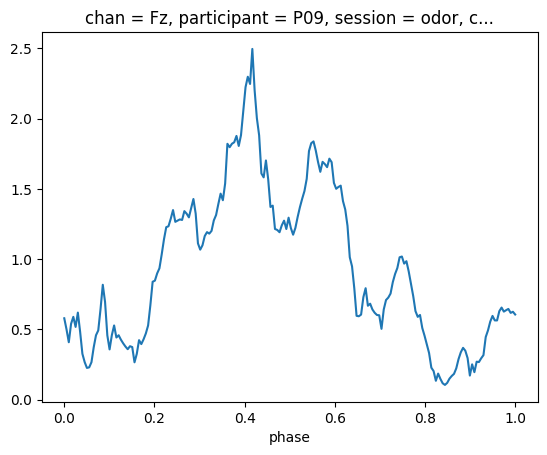

In [23]:
da.loc['Fz','P09','odor',0.75, :,:][28,:].plot()

In [24]:
modulation[(modulation['r'] > 0.2) & (modulation['ptp'] > 50)]

,chan,ind_f,f,r,ptp,mi


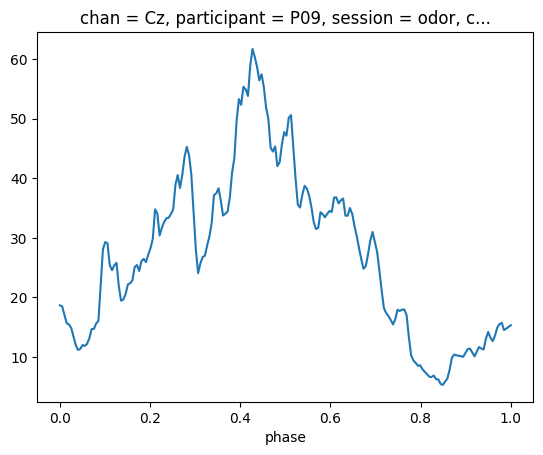

In [25]:
da.loc['Cz','P09','odor',0.75, :,:][28,:].plot()

# Recompute modulation from raw power (not zscored)

In [63]:
from compute_resp_features import respiration_features_job
from tqdm import tqdm

## One one patient / session

In [68]:
sub = 'P09'
n_bins = 100
ses = 'odor'
chan = 'C4'
quantile_stacking = 0.75

resp = respiration_features_job.get(sub, ses).to_dataframe()
cycle_times = resp[['inspi_time','expi_time','next_inspi_time']].values
# cycle_times = resp[['inspi_time','next_inspi_time']].values
phase = np.linspace(0,1,n_bins)

res = None
loop = tqdm(enumerate(chans))
for i, chan in loop:
    da = power_job.get(sub,ses,chan)['power']
    # data = da.values.T
    data = da.values
    data = data.T - np.median(data, axis = 1)
    data = data
    deformed_data_stacked = physio.deform_traces_to_cycle_template(data = data,
                                           times = da['time'].values,
                                           cycle_times = cycle_times,
                                           points_per_cycle = n_bins,
                                           segment_ratios = 0.4
                                          )
    q = np.quantile(deformed_data_stacked, q = quantile_stacking, axis = 0) # phase * freq
    # q = np.mean(deformed_data_stacked, axis = 0) # phase * freq
    q = q.T # freq * phase
    
    if res is None:
        res = gh.init_da({'chan':chans,
                         'freq':da['freq'].values,
                         'phase':phase
                         })
    res.loc[chan,:,:] = q
    
                                            

32it [00:09,  3.40it/s]


In [81]:
sub = 'P09'
n_bins = 100
ses = 'odor'
chan = 'C4'
quantile_stacking = 0.75

resp = respiration_features_job.get(sub, ses).to_dataframe()
cycle_times = resp[['inspi_time','expi_time','next_inspi_time']].values
# cycle_times = resp[['inspi_time','next_inspi_time']].values
phase = np.linspace(0,1,n_bins)

res = None

da = power_job.get(sub,ses,chan)['power']
# data = da.values.T
data = da.values
data = data.T - np.median(data, axis = 1)
data = data
deformed_data_stacked = physio.deform_traces_to_cycle_template(data = data,
                                       times = da['time'].values,
                                       cycle_times = cycle_times,
                                       points_per_cycle = n_bins,
                                       segment_ratios = 0.4
                                      )
da_cycles = xr.DataArray(data = deformed_data_stacked, dims = ['cycle','phase','freq'],
                         coords = {'cycle':range(deformed_data_stacked.shape[0]), 'phase':np.linspace(0,1,n_bins), 'freq':da.coords['freq'].values})

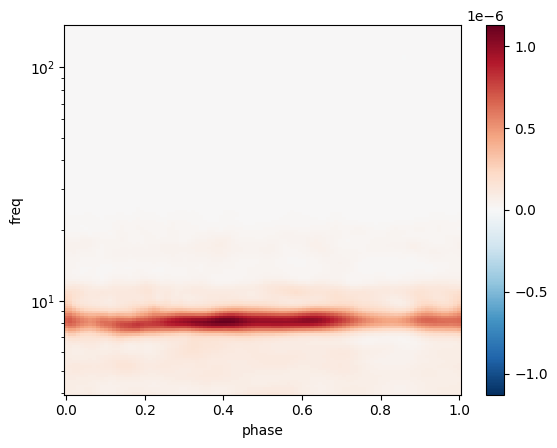

In [86]:
da_cycles.mean('cycle').T.plot(yscale = 'log')

In [80]:
deformed_data_stacked.shape

(102, 100, 150)

In [69]:
chan

'Cz'

In [66]:


n_cycles = resp.shape[0]
mu_freq = resp['cycle_freq'].mean()
sd_freq = resp['cycle_freq'].std()
random_freq = np.random.randn(n_cycles) * sd_freq + mu_freq
random_durations = 1 / random_freq
random_ratio = np.random.randn(n_cycles) * resp['cycle_ratio'].std() / 2 + resp['cycle_ratio'].mean()

# fig , ax = plt.subplots()
# bins = np.arange(-5, 20, 0.5)
# ax.hist(resp['cycle_duration'], bins = bins, alpha = 0.5)
# ax.hist(random_durations, bins = bins, alpha = 0.5)
# plt.show()

random_first_start_inspi = np.random.uniform(0, 2, 1)[0]

random_cycle_times = np.zeros(cycle_times.shape)

for i, dur in enumerate(random_durations):
    if i == 0:
        random_cycle_times[i,0] = random_first_start_inspi
        random_cycle_times[i,1] = random_first_start_inspi + random_durations[i] * random_ratio[i]
        random_cycle_times[i,2] = random_first_start_inspi + random_durations[i]
    else:
        random_cycle_times[i,0] = random_cycle_times[i-1,2]
        random_cycle_times[i,1] = random_cycle_times[i-1,2] + random_durations[i] * random_ratio[i]
        random_cycle_times[i,2] = random_cycle_times[i-1,2] + random_durations[i]    
        
print(np.round(random_cycle_times[-1,:], 1))

[1343.9 1346.  1349.2]


In [228]:
sub = 'P12'
ses = 'odor'
chan = 'C4'
test_sig = eeg_interp_artifact_job.get(sub, ses)['interp'].loc[chan,:].values
resp = respiration_features_job.get(sub, ses).to_dataframe()
cycle_times = resp[['inspi_time','expi_time','next_inspi_time']].values
srate = 1000
times = np.arange(0, test_sig.shape[0] / srate, 1 / srate)
fr, power_test = gh.morlet_power(test_sig, srate, 15, 35, 40, 15, amplitude_exponent=2)
n_bins = 100

deform = physio.deform_traces_to_cycle_template(data = power_test.T,
                                           times = times,
                                           cycle_times = cycle_times,
                                           points_per_cycle = n_bins,
                                           segment_ratios = 0.4
                                          )

da_deform = xr.DataArray(data = deform,
                         dims = ['cycle','phase','freq'],
                         coords = {'cycle':range(deform.shape[0]),
                                   'phase':np.linspace(0,1,deform.shape[1]),
                                  'freq':fr,
                                  }
                        )

# deform_random = physio.deform_traces_to_cycle_template(data = power_test.T,
#                                            times = times,
#                                            cycle_times = random_cycle_times,
#                                            points_per_cycle = n_bins,
#                                            segment_ratios = 0.4
#                                           )

# da_deform_random = xr.DataArray(data = deform_random,
#                          dims = ['cycle','phase','freq'],
#                          coords = {'cycle':range(deform.shape[0]),
#                                    'phase':np.linspace(0,1,deform.shape[1]),
#                                   'freq':fr,
#                                   }
#                         )

In [229]:
# def cv_axis(data, axis = -1):
#     return np.std(data, axis = axis) / np.mean(data, axis=axis)

# fig, ax = plt.subplots()
# for i in range(18,24):
#     cv = cv_axis(deform[i,:,:], axis = 0)
#     ax.plot(fr, cv, label = i)
# ax.legend()

In [230]:
# da_deform.plot.pcolormesh(x = 'phase', y = 'freq', col = 'cycle', col_wrap = 5)

In [231]:
# da_deform_random.plot.pcolormesh(x = 'phase', y = 'freq', col = 'cycle', col_wrap = 5)

In [232]:
da_deform

<xarray.DataArray (cycle: 184, phase: 100, freq: 40)>
array([[[1.38671224e-09, 9.48844831e-10, 2.52752137e-09, ...,
         1.41285876e-09, 1.74252010e-09, 2.04358326e-09],
        [1.22996714e-09, 5.90984305e-10, 2.74745665e-09, ...,
         1.96043520e-09, 2.19243440e-09, 2.36150597e-09],
        [1.18355536e-09, 2.91134656e-10, 3.00789635e-09, ...,
         2.31120298e-09, 2.44633345e-09, 2.43579907e-09],
        ...,
        [2.13028868e-08, 1.77510962e-08, 1.83664509e-08, ...,
         1.38193466e-08, 1.48387842e-08, 1.50471372e-08],
        [2.11773165e-08, 2.03326873e-08, 2.30009992e-08, ...,
         1.83505074e-08, 1.90018067e-08, 1.87271287e-08],
        [1.91489655e-08, 2.05993814e-08, 2.59747044e-08, ...,
         1.90012264e-08, 1.93105511e-08, 1.88637480e-08]],

       [[1.52088531e-08, 1.84190260e-08, 2.70511352e-08, ...,
         1.42182336e-08, 1.46968475e-08, 1.48572961e-08],
        [1.02151123e-08, 1.46195824e-08, 2.66096192e-08, ...,
         7.04511501e-09, 7.94213334e-09, 8.99092749e-09],
        [5.19632462e-09, 1.03839924e-08, 2.54874554e-08, ...,
         1.76596504e-09, 2.83040997e-09, 4.28130435e-09],
...
        [1.52514937e-08, 2.43245274e-08, 2.82389360e-08, ...,
         2.07092706e-09, 2.11231123e-09, 2.17532206e-09],
        [1.43696375e-08, 2.45864655e-08, 3.16156218e-08, ...,
         3.34936664e-09, 4.49559579e-09, 5.54748403e-09],
        [1.38673546e-08, 2.38143248e-08, 3.27356928e-08, ...,
         6.15827654e-09, 8.50405514e-09, 1.06745972e-08]],

       [[1.34036717e-08, 2.17906747e-08, 3.11473414e-08, ...,
         1.18416655e-08, 1.52391267e-08, 1.81785557e-08],
        [1.27838755e-08, 1.88759972e-08, 2.74566603e-08, ...,
         1.84346821e-08, 2.25581281e-08, 2.57732094e-08],
        [1.18679463e-08, 1.50797081e-08, 2.20747132e-08, ...,
         2.38802259e-08, 2.84509722e-08, 3.16817227e-08],
        ...,
        [3.31160909e-07, 3.86119083e-07, 4.07206450e-07, ...,
         8.45714664e-09, 6.07721605e-09, 4.07353767e-09],
        [2.60837615e-07, 3.25609638e-07, 3.63292988e-07, ...,
         8.02670540e-09, 6.37962124e-09, 4.95910457e-09],
        [1.90459717e-07, 2.57727220e-07, 3.11687101e-07, ...,
         6.54914995e-09, 5.42216141e-09, 4.36348485e-09]]])
Coordinates:
  * cycle    (cycle) int64 0 1 2 3 4 5 6 7 8 ... 176 177 178 179 180 181 182 183
  * phase    (phase) float64 0.0 0.0101 0.0202 0.0303 ... 0.9798 0.9899 1.0
  * freq     (freq) float64 15.0 15.51 16.03 16.54 ... 33.46 33.97 34.49 35.0

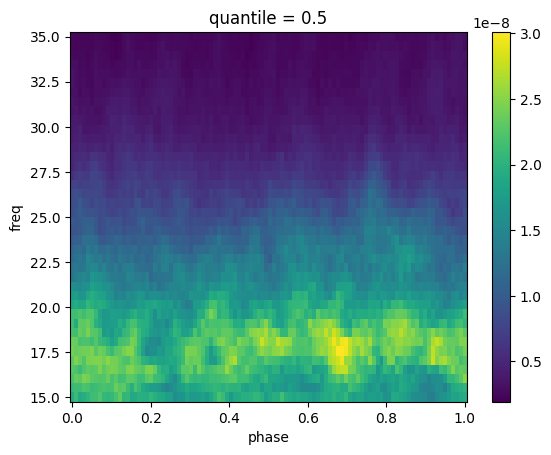

In [233]:
da_deform.loc[:, :,:].quantile(0.5, 'cycle').plot.pcolormesh(x = 'phase', y = 'freq')

In [235]:
da_deform_log = da_deform.copy()
da_deform_log[:] = np.log(da_deform.values)

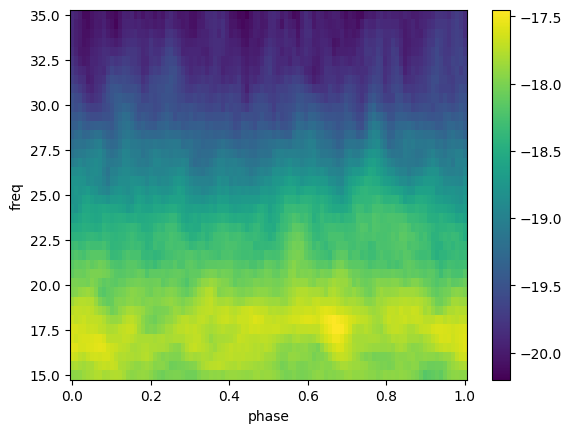

In [236]:
da_deform_log.mean('cycle').plot.pcolormesh(x = 'phase', y = 'freq')

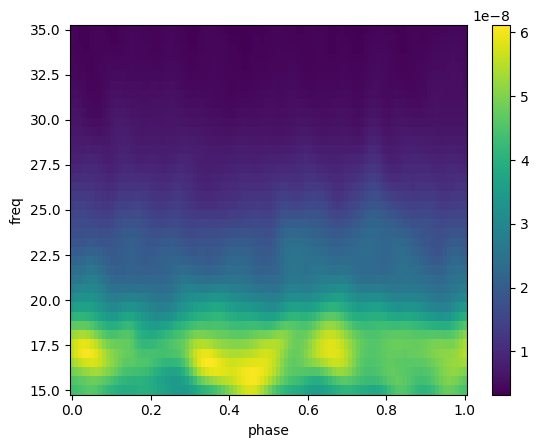

In [227]:
da_deform.mean('cycle').plot.pcolormesh(x = 'phase', y = 'freq')

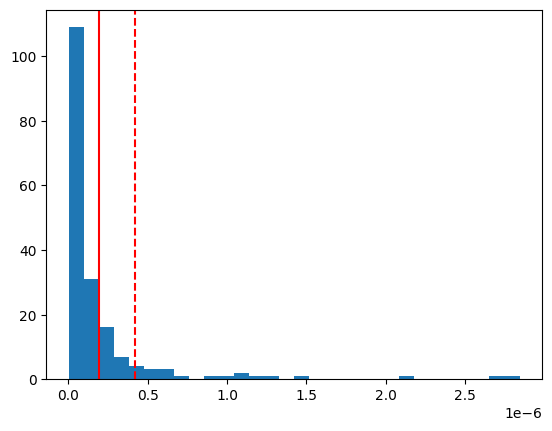

In [220]:
fig, ax = plt.subplots()
colonne = da_deform[:,55,9].values
ax.hist(colonne, bins = 30)
ax.axvline(np.mean(colonne), color = 'r')
ax.axvline(np.quantile(colonne, 0.9), color = 'r', ls = '--')
plt.show()

In [212]:
da_deform['freq'].values[9]

8.482758620689655

In [208]:
da_deform

<xarray.DataArray (cycle: 184, phase: 100, freq: 30)>
array([[[8.63535348e-08, 3.27313353e-08, 4.66561713e-08, ...,
         4.48951086e-08, 1.33728596e-08, 3.61572762e-09],
        [8.94385949e-08, 3.35958469e-08, 4.64454467e-08, ...,
         4.36937026e-08, 1.48694416e-08, 5.69439935e-09],
        [9.24909525e-08, 3.43190107e-08, 4.62986039e-08, ...,
         4.25213493e-08, 1.65926099e-08, 8.13236167e-09],
        ...,
        [3.26501832e-08, 5.59388134e-08, 1.10474495e-07, ...,
         1.47912083e-08, 3.78061229e-08, 6.08702600e-08],
        [2.85421498e-08, 5.31891058e-08, 1.18876382e-07, ...,
         2.08205589e-08, 4.46878577e-08, 6.69981975e-08],
        [2.50995738e-08, 5.08148192e-08, 1.27159959e-07, ...,
         2.79832173e-08, 5.25836430e-08, 7.34648106e-08]],

       [[2.22853880e-08, 4.88220489e-08, 1.35290312e-07, ...,
         3.61027815e-08, 6.13528243e-08, 8.02151822e-08],
        [2.01290223e-08, 4.72623456e-08, 1.42951257e-07, ...,
         4.46321591e-08, 7.04488050e-08, 8.69180972e-08],
        [1.84768270e-08, 4.60502830e-08, 1.50414833e-07, ...,
         5.36354486e-08, 7.99634716e-08, 9.37285223e-08],
...
        [1.07098149e-07, 6.75023324e-09, 2.77203608e-08, ...,
         1.99695898e-08, 2.37345383e-08, 1.29665216e-08],
        [1.05649256e-07, 8.02756019e-09, 2.87657936e-08, ...,
         1.59963104e-08, 2.07249722e-08, 1.03399436e-08],
        [1.04283276e-07, 9.51758977e-09, 2.98989804e-08, ...,
         1.28346958e-08, 1.84864970e-08, 8.95937952e-09]],

       [[1.02992106e-07, 1.11587252e-08, 3.10857197e-08, ...,
         1.04943934e-08, 1.69427126e-08, 8.70634782e-09],
        [1.01897013e-07, 1.26987083e-08, 3.21573993e-08, ...,
         9.06922579e-09, 1.60759490e-08, 9.30568983e-09],
        [1.00849457e-07, 1.42640754e-08, 3.32096906e-08, ...,
         8.20887756e-09, 1.56164049e-08, 1.05553472e-08],
        ...,
        [1.89511305e-07, 7.03207704e-09, 1.05941563e-07, ...,
         2.10410862e-07, 2.60633406e-07, 3.32525880e-07],
        [1.84277342e-07, 6.39556677e-09, 1.08693214e-07, ...,
         1.86909543e-07, 2.29275869e-07, 2.94453963e-07],
        [1.78600622e-07, 6.81363975e-09, 1.12067046e-07, ...,
         1.62966302e-07, 1.96769541e-07, 2.54786839e-07]]])
Coordinates:
  * cycle    (cycle) int64 0 1 2 3 4 5 6 7 8 ... 176 177 178 179 180 181 182 183
  * phase    (phase) float64 0.0 0.0101 0.0202 0.0303 ... 0.9798 0.9899 1.0
  * freq     (freq) float64 6.0 6.276 6.552 6.828 ... 13.17 13.45 13.72 14.0

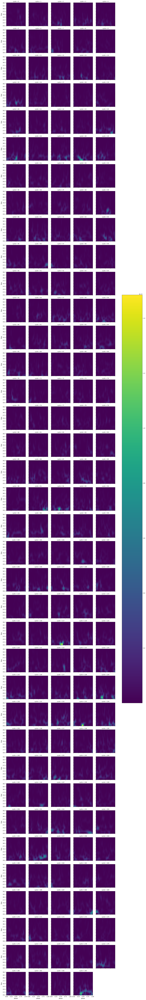

In [234]:
da_deform.plot.pcolormesh(x = 'phase', y = 'freq', col = 'cycle', col_wrap = 5)

In [ ]:
vmin = deform.min() if deform.min() < deform_random.min() else deform_random.min()
vmax = deform.max() if deform.max() > deform_random.max() else deform_random.max()

fig, ax = plt.subplots()
ax.pcolormesh(range(deform.shape[1]), fr, np.quantile(deform , q=0.75, axis = 0).T, vmin=vmin, vmax=vmax)

fig, ax = plt.subplots()
ax.pcolormesh(range(da_deform_random.shape[1]), fr, np.quantile(da_deform_random , q=0.75, axis = 0).T, vmin=vmin, vmax=vmax)

In [ ]:
fig, ax = plt.subplots()
im = ax.pcolormesh(res['phase'].values, res['freq'].values, deformed_data_stacked[0,:,:].T)
clb = fig.colorbar(im, ax=ax)
clb.set_label('Power (µV)')

In [ ]:
res.plot.pcolormesh(x = 'phase', y = 'freq', col = 'chan', col_wrap = 5, yscale = 'log')

In [ ]:
chan = 'CP2'

f = res['freq'].values
yticks = [f[0],8,12,30,50,100,f[-1]]
yticks = np.round(yticks)

fig, ax = plt.subplots()
im = ax.pcolormesh(phase, f , res.loc[chan,:,:].values)
ax.set_ylabel('Frequency (Hz)')
ax.set_yscale('log')
ax.set_yticks(ticks = yticks, labels = yticks)
ax.minorticks_off()
ax.set_xlabel('Phase')

clb = fig.colorbar(im, ax=ax)
clb.ax.set_title('µV')
plt.show()

In [ ]:
f = res['freq'].values
yticks = [f[0],8,12,30,50,100,f[-1]]
yticks = np.round(yticks)

fig, ax = plt.subplots()
to_ptp = res.values
to_ptp = to_ptp - np.mean(to_ptp, axis = 2)
ptp_raw = np.ptp(to_ptp, axis = -1).T
im = ax.pcolormesh(chans, f , ptp_raw)
ax.set_ylabel('Frequency (Hz)')
ax.set_yscale('log')
ax.set_yticks(ticks = yticks, labels = yticks)
ax.minorticks_off()
ax.set_xticks(range(len(chans)), labels = chans, rotation = 90)
ax.set_xlabel('Phase')

clb = fig.colorbar(im, ax=ax)
clb.ax.set_title('µV')
plt.show()

# Test coefficient of variation over time axis of whole power (loop over participants, sessions, channels)

In [48]:
cvs = None
sess = ['baseline','music','odor']
for sub in subject_keys:
    print(sub)
    for ses in sess:
        print(ses)
        for chan in chans:
            da = power_job.get(sub,ses,chan)['power']
            data = da.values
            m = np.mean(data, axis = 1)
            s = np.std(data, axis = 1)
            cv = s / m
            if cvs is None:
                cvs = gh.init_da({'sub':subject_keys,
                                  'ses':sess,
                                  'chan':chans,
                                  'freq':da['freq'].values})
            cvs.loc[sub, ses, chan, :] = cv                                                                             

P01
baseline


KeyboardInterrupt: 

In [ ]:
data_sub.plot.pcolormesh(x = 'chan', y = 'freq', col = 'ses', yscale = 'log', size = 5)

In [ ]:
subs = cvs['sub'].values
xticks = [f[0], 8, 12, 30, 50, 100, f[-1]]
xticks = np.round(xticks).astype(int)

ax_x_start = 0.95
ax_x_width = 0.02
ax_y_height = 0.8
ax_y_start = 0

dq = 0.001
vmin  = cvs.quantile(dq)
vmax = cvs.quantile(1 - dq)

for sub in subs:
    fig, axs = plt.subplots(ncols = len(sess), figsize = (11,3))
    fig.suptitle(sub, y = 1.05, fontsize = 20)
    data_sub = cvs.sel(sub = sub)
    for c, ses in enumerate(sess):
        ax = axs[c]
        data = data_sub.loc[ses, :,:].values.T
        im = ax.pcolormesh(chans, f, data, vmin = vmin, vmax=vmax)
        ax.set_title(ses)
        ax.set_yscale('log')
        ax.set_yticks(xticks, labels = xticks)
        ax.set_xticks(chans, labels = chans, rotation = 90, fontsize = 6)
        
    cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
    clb = fig.colorbar(im, cax=cbar_ax)
    clb.ax.set_title('CV')

    plt.show()

In [ ]:
cvs.mean('sub').plot.pcolormesh(x = 'chan', y = 'freq', col = 'ses', yscale = 'log')

In [ ]:
cvs_normalized = cvs.copy()

for sub in subs:
    cvs_sub = cvs.sel(sub = sub).values
    cvs_normalized.loc[sub,:,:,:] = (cvs_sub - np.mean(cvs_sub)) / np.std(cvs_sub)

In [ ]:
subs = cvs_normalized['sub'].values
xticks = [f[0], 8, 12, 30, 50, 100, f[-1]]
xticks = np.round(xticks).astype(int)

ax_x_start = 0.95
ax_x_width = 0.02
ax_y_height = 0.8
ax_y_start = 0

dq = 0.001
vmin  = cvs_normalized.quantile(dq)
vmax = cvs_normalized.quantile(1 - dq)

for sub in subs:
    fig, axs = plt.subplots(ncols = len(sess), figsize = (11,3))
    fig.suptitle(sub, y = 1.05, fontsize = 20)
    data_sub = cvs_normalized.sel(sub = sub)
    for c, ses in enumerate(sess):
        ax = axs[c]
        data = data_sub.loc[ses, :,:].values.T
        im = ax.pcolormesh(chans, f, data, vmin = vmin, vmax=vmax)
        ax.set_title(ses)
        ax.set_yscale('log')
        ax.set_yticks(xticks, labels = xticks)
        ax.set_xticks(chans, labels = chans, rotation = 90, fontsize = 6)
        
    cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
    clb = fig.colorbar(im, cax=cbar_ax)
    clb.ax.set_title('CV')

    plt.show()

In [ ]:
cvs_normalized.mean('sub').plot.pcolormesh(x = 'chan', y = 'freq', yscale = 'log', col = 'ses', cmap = 'viridis', )